# Import Libraries & Set up the Environment
The provided code snippet imports various Python libraries and sets up the environment for analysis. It includes libraries such as NumPy, pandas, Matplotlib, scikit-learn, PyMC3, and more. Additionally, it configures options for data display and interaction in Jupyter Notebook, prints the version of PyMC3, and prepares the environment for bayesian statistical modeling and machine learning tasks.

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
import theano
from itertools import repeat
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('display.max_columns', None)
from functools import reduce
import seaborn as sns
import os
import arcpy
import matplotlib
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from collections import defaultdict

print('Running on PyMC3 v{}'.format(pm.__version__))

Running on PyMC3 v3.9.3


# Configuring Visualization Settings for High-Quality Graphics
The code snippet below sets specific configurations for visualizations in Python, assuming it's used in a Jupyter Notebook. It sets the figure format for Matplotlib to 'retina', which is a high-resolution display option often used for high-quality graphics. It also applies a specific style for ArviZ, a library for Bayesian analysis, to 'arviz-darkgrid', which affects the visual style of plots and graphics generated using ArviZ. These configurations can enhance the quality and appearance of your data visualizations.

In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use('arviz-darkgrid')

# Step 1: County-Level Data Preprocessing for Socioeconomic and Broadband Analysis
This segment involves obtaining and preprocessing county-level socioeconomic and FCC 477 broadband data from December 2019. The analysis is focused on specific regions of the United States, including South, West, Northeast, and Midwest. Input data loaded here includes parameters related to education, unemployment, median household income, and poverty, obtained from various sources, including the U.S. Census Bureau, U.S. Department of Labor, and U.S. Department of Commerce. Furthermore, the code integrates county-level American Community Survey (ACS) 2018 5-year estimates from US Census website. The result is a preprocessed dataset that's ready for further analysis. Please refer to the [README file](https://github.com/bkasaeer1/Hierarchical-Bayesian-Modeling-Internet-Access/blob/main/README.md) for details about the input parameter names and description.

In [219]:
# the path to your local directory containing the project files
rt = r'path/to/your/project/output/directory'
df = pd.read_csv(rt + '\\Input.csv')
df.head(1)
df.describe()

,GEOID,NPROVIDERS_CON,NTECHS_CON,SATISFIES253_CON,amin_CONDN,amax_CONDN,90-th percentile_CONDN,10-th percentile_CONDN,median_CONDN,std_CONDN,10-th percentile_CONUP,amin_CONUP,amax_CONUP,90-th percentile_CONUP,median_CONUP,std_CONUP,NPROVIDERS_FW,ACSPctBelDiplom5yr2018,ACSPctSomCollegORAssociate5yr2018,ACSPctBSCorHigher5yr2018,State,County,CensusPop2010,USDAPopEst2019,BLSUnempRateAvg2019,DOCMedHHIncomeUSD2018,DOCMedHHIncomePctofState2018,CensusNumPeopInPoverty2018,CensusPctPoverty2018,CensusMedHHIncomUSD2018,Region,ACSPctBelPov,ACSPctNoIntAcc,ACSIncPerCapUSD,ACSPctBelowBS
0,01001,3316,7,2021,0.768,1000.0,1000.0,6.0,940.0,476.425628,0.512,0.128,1000.0,50.0,35.0,118.558437,341.0,11.3,28.4,27.7,AL,Autauga County,"54,571","55,869",2.7,"59,338",119.0,"7,587",13.8,"59,338",South,12.969117,19.029126,29372.0,72.310714


,NPROVIDERS_CON,NTECHS_CON,SATISFIES253_CON,amin_CONDN,amax_CONDN,90-th percentile_CONDN,10-th percentile_CONDN,median_CONDN,std_CONDN,10-th percentile_CONUP,amin_CONUP,amax_CONUP,90-th percentile_CONUP,median_CONUP,std_CONUP,NPROVIDERS_FW,ACSPctBelDiplom5yr2018,ACSPctSomCollegORAssociate5yr2018,ACSPctBSCorHigher5yr2018,BLSUnempRateAvg2019,DOCMedHHIncomePctofState2018,CensusPctPoverty2018,ACSPctBelPov,ACSPctNoIntAcc,ACSIncPerCapUSD,ACSPctBelowBS
count,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3231.000000,3026.000000,3218.000000,3218.000000,3218.000000,3217.000000,3139.000000,3139.000000,3217.000000,3218.000000,3217.000000,3218.000000
mean,8590.171154,6.427422,4674.885484,4.737238,926.554318,689.233132,15.224906,117.049146,310.979927,5.826802,1.181568,723.770350,223.342685,32.133869,143.585175,3121.556841,13.738067,30.507272,21.574394,4.140255,89.469290,15.143931,14.244845,23.231700,26648.498601,78.425219
std,16116.768531,1.513073,9758.159976,53.152948,230.315221,403.210988,90.879329,266.227877,142.323221,64.457726,19.935442,403.950181,363.717922,144.006723,139.636765,5619.837829,6.675942,5.360550,9.359327,1.772596,20.058754,6.077866,7.405395,9.266535,6915.576761,9.359059
min,2.000000,1.000000,0.000000,0.250000,4.000000,2.000000,0.256000,0.700000,0.000000,0.064000,0.064000,1.000000,0.064000,0.064000,0.000000,1.000000,1.200000,5.800000,0.000000,0.700000,43.900000,2.600000,1.559067,2.796655,5974.000000,21.468628
25%,2240.500000,6.000000,942.000000,0.512000,1000.000000,200.000000,2.000000,12.000000,215.559319,0.384000,0.064000,200.000000,35.000000,1.000000,22.808412,341.250000,8.800000,27.000000,15.100000,3.000000,76.200000,10.800000,9.581395,16.972319,22498.000000,74.496026
50%,4685.000000,6.000000,2155.000000,0.768000,1000.000000,940.000000,6.000000,25.000000,354.551186,0.512000,0.128000,1000.000000,35.000000,3.000000,92.540707,1576.500000,12.300000,30.500000,19.300000,3.700000,86.900000,14.100000,12.805821,21.960465,26103.000000,80.674984
75%,9171.000000,7.000000,4684.500000,1.000000,1000.000000,1000.000000,6.000000,50.000000,427.191824,1.000000,0.128000,1000.000000,100.000000,10.000000,233.511776,3879.750000,17.700000,34.100000,25.500000,4.700000,99.200000,18.300000,16.737122,28.111038,29975.000000,84.883450
max,357474.000000,11.000000,196950.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,497.126893,1000.000000,500.000000,1000.000000,1000.000000,1000.000000,498.661618,133100.000000,66.300000,57.300000,78.500000,18.300000,263.600000,48.400000,59.946950,79.623309,72832.000000,100.000000


# Step 2: Exploring Correlations Between County-level Internet Access and Socioeconomic Parameters in Various U.S. Regions 
In this step, a heatmap correlation plot is created to visualize the relationships and distributions of various parameters used in this analysis. The focus is on identifying strong correlations between internet access and county socioeconomic parameters such as poverty, income, and unemployment rate. The code defines a function to generate Pearson correlation heatmaps. Review of the correlations, specifically in the Northeastern region of the U.S., reveals a strong positive correlation between the percentage of the population below the poverty line and the percentage of the population with no internet access. This correlation varies among different U.S. regions, with the highest observed in the Southern U.S. and the lowest in the Midwestern U.S. Further analysis is planned, including scatter plots and distribution analysis of these parameters across regions.

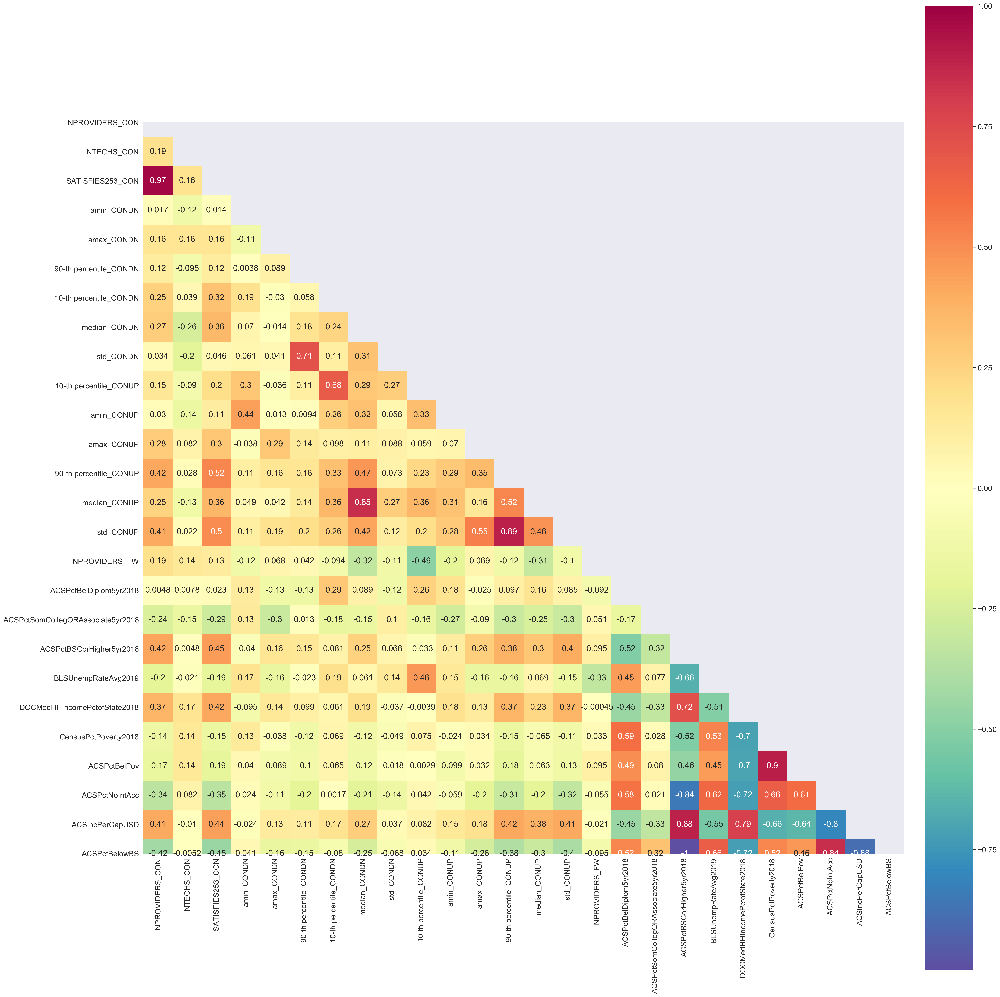

In [222]:
# heatmap correlation plot 
def create_cor_stats(df, Annot = True):
    
    """
    This function plots the correlation heatmap for a pandas dataframe

    INPUTS:
    df: a pandas dataframe to read the data from
    Annot: specifies if annotation is added or not 

    OUTPUTS: 
    creates a heatmap of correlation between df varaibles
    """
    fig = plt.figure(figsize = (30,30))
    ax = fig.add_subplot(111)
    mask = np.zeros_like(df.corr())
    mask[np.triu_indices_from(mask)] = True
    _ = sns.heatmap(df.corr(),cmap = 'Spectral_r', mask = mask, 
                    square = True, annot = Annot,ax = ax) 

sns.set(font_scale = 1.5)
create_cor_stats(df[df.Region == 'Northeast'])

# Step 3: Exploring Correlations Between Poverty and Internet Access Across U.S. Regions
In this section, pairplots are used to detect significant correlations between pairs of studied parameters. The code selects the final X and Y variables for analysis, where X represents percent population in each county with income below the poverty line, and Y represents percent population in each county with no internet access. It prepares the data by transforming percentage values into fractions. Note that the effect of log transformation of the data was also examined and it was found that it doesn't significantly improve the results. The analysis reveals that both poverty and internet access are normally distributed across all four U.S. regions. Notably, in the Southern U.S., the center of the cluster is higher than in other regions and the distribution has a thicker tail to the right (i.e. greater Kurtosis), indicating greater variation in poverty and internet access. The remainder of the analysis will concentrate on the Northeastern U.S.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\seaborn\axisgrid.py:1350: UserWarning: This figure was using constrained_layout==True, but that is i

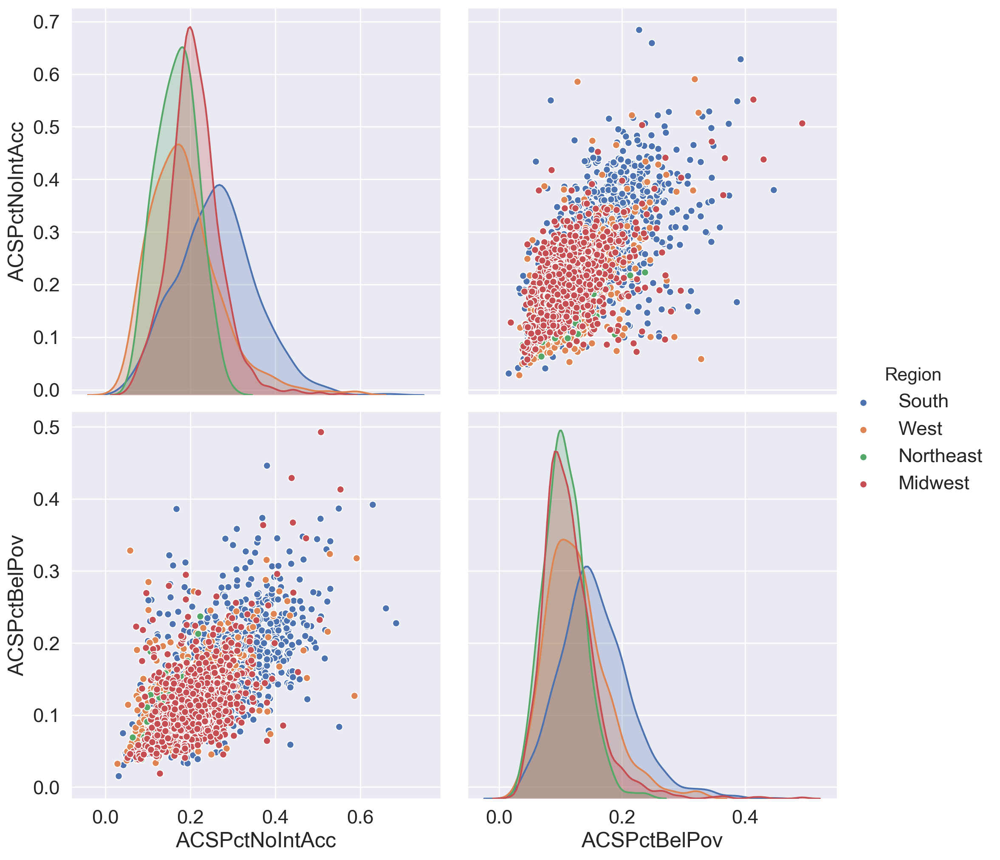

In [443]:
#ACSPctNoIntAcc: percent population in each county with no internet access 
# (from ACS 2018 5-year estimates)
#ACSPctBelPov: percent population in each county with income below the poverty line 
# (from ACS 2018 5-year estimates)
XYParams = ['ACSPctNoIntAcc','ACSPctBelPov']
df = df[XYParams + ['Region','GEOID','County','State']]
df.loc[:,XYParams] = df[XYParams].values / 100
df['ACSPctNoIntAcc'] = df['ACSPctNoIntAcc'].astype(theano.config.floatX)

#plot it before log transform
_=sns.pairplot(df[XYParams + ['Region']], hue = 'Region',height = 5)

# Step 4: Data Preparation and Distribution Analysis for "No Internet Access Rate" in Northeastern U.S.
In this step of the analysis, a histogram of the selected target variable, "no internet access rate" is plotted to examine its distribution. Results for the Northeastern U.S. showed that the distribution of the "no internet access rate" is approximately normal with a peak around 0.17, indicating that further data transformation is unnecessary.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


,ACSPctNoIntAcc,ACSPctBelPov,Region,GEOID,County,State,State_Code
308,0.101841,0.069764,Northeast,09001,Fairfield County,CT,0
309,0.144541,0.096340,Northeast,09003,Hartford County,CT,0
310,0.119494,0.065510,Northeast,09005,Litchfield County,CT,0
311,0.117906,0.063550,Northeast,09007,Middlesex County,CT,0
312,0.153333,0.099667,Northeast,09009,New Haven County,CT,0


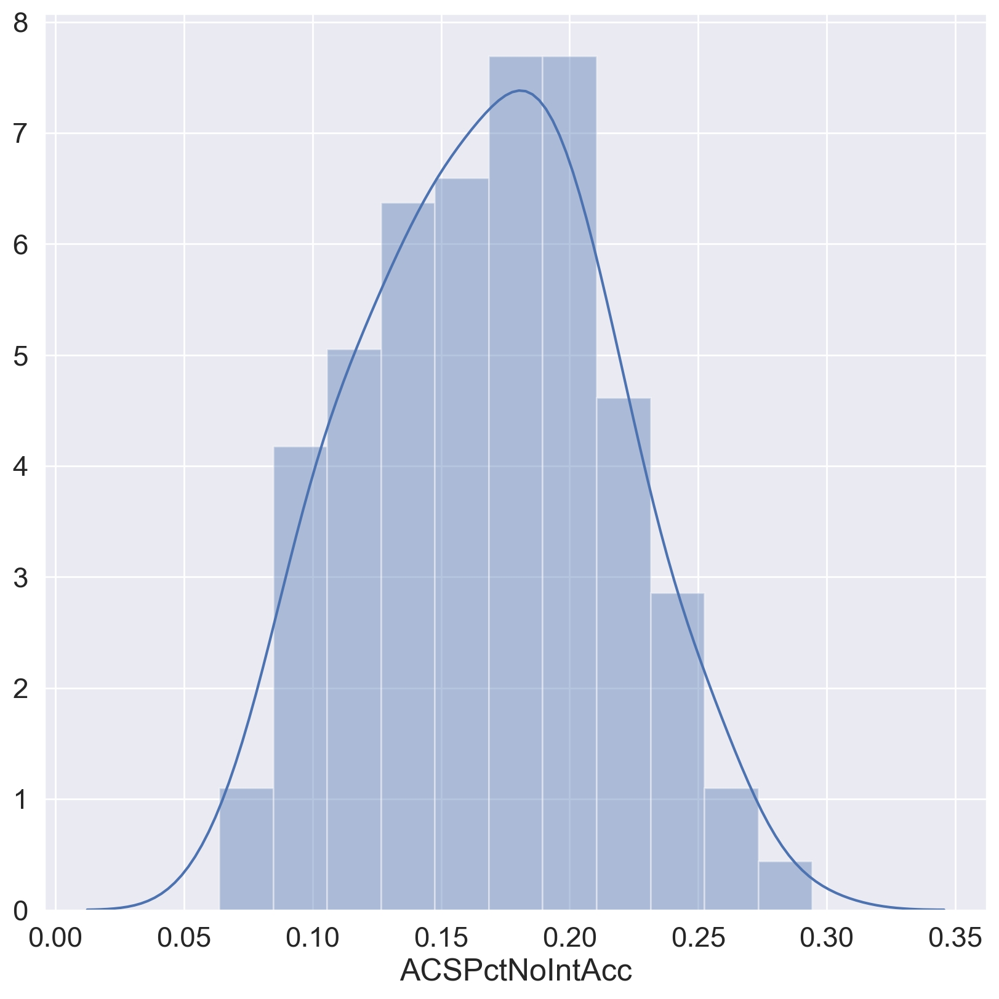

In [444]:
# plot histogram of percent population in each county with no internet access 
#(from ACS 2018 5-year estimates) for NE USA
sns.set_style('darkgrid')
data = df[df.Region == 'Northeast']
state_names = data.State.unique()
n_states = len(data.State.unique())

#create a state index column 
state_lookup = dict(zip(state_names, range(n_states)))
data["State_Code"] = data.State.values
data["State_Code"] = data.State.replace(state_lookup).values
state_idx = data.State_Code.values

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(111)
_ = sns.distplot(data.ACSPctNoIntAcc,ax = ax)
data.head()

# Step 5: Building Unpooled Bayesian Models for Relashionship between Internet Access and Poverty
In this step of the analysis, Bayesian models are built to define priors for an unpoole model. In this case, the data is treated as independent in each state, and the relationship between internet access and poverty is estimated separately per state. The model includes parameters a and b, representing state-specific coefficients, and model error (eps) that accounts for variability. The data likelihood is specified as a normal distribution. These Bayesian models are implemented using PyMC3 to facilitate probabilistic modeling, allowing for the estimation of relationships between variables while accounting for uncertainty in the parameters. 

In [250]:
#Build priors for unpooled, complete pooled, and partial pooled (HLM) models
with pm.Model() as unpooled_model:

    # Independent parameters for each county
    a = pm.Normal('a', 0, sigma = 100, shape = n_states)
    b = pm.Normal('b', 0, sigma = 100, shape = n_states)

    # Model error
    eps = pm.HalfCauchy('eps', 5)

    NoIntAccRate_est = a[state_idx] + b[state_idx]*data.ACSPctBelPov.values

    # Data likelihood
    y = pm.Normal('y', NoIntAccRate_est, sigma = eps, observed = data.ACSPctNoIntAcc)

# Step 6: Saving Posterior Traces in Unpooled Bayesian Modeling
The primary purpose of this code is to create posterior traces for a previously defined Bayesian model (unpooled_model) and save those traces for future analysis. The pm.sample function is used to perform Bayesian sampling to generate posterior traces, which capture the parameter estimates and uncertainty. The traces can be essential for posterior analysis and diagnostics. 

In [254]:
%%time
#Only the first time, run the model to create posterior traces and save the model trace for later load and use 
with unpooled_model:
    unpooled_trace = pm.sample(2000, cores = 1)

#saving the unpooled model 
pm.save_trace(unpooled_trace,'SavedModels/Unpooled',overwrite=True)

#if the model is previosly run and traces are created, I only load them
#with unpooled_model:
#    unpooled_trace = pm.load_trace('SavedModels/Unpooled')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, b, a]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 3384 seconds.


Wall time: 56min 45s


# Step 7: Analyzing Posterior Distributions of Parameters in Unpooled Bayesian Models
In this step, trace plots of unpooled Bayesian models are created to visualize the posterior distributions of their parameters. The code employs PyMC3 to generate these trace plots, focusing on parameters such as line slope (b), intercept (a), and the standard deviation (sigma) of the likelihood function for internet access estimations. The results of the Unpooled model's trace plot analysis show that the posterior distribution of the line slope (b) is generally centered around positive values for all nine Northeastern U.S. states, indicating that poverty controls internet access in these regions. However, the wide posterior distributions of these parameters suggest high standard deviation or variation, likely due to the limited number of data points within each state. Additionally, the intercept (a) is centered around various positive values, and the sigma posterior distribution is centered around 0.033, indicating high standard deviation in the unpooled model, which can be attributed to errors in estimating internet access from poverty, influenced by local barriers and uncertainties in socioeconomic and broadband-related factors.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\arviz\data\io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


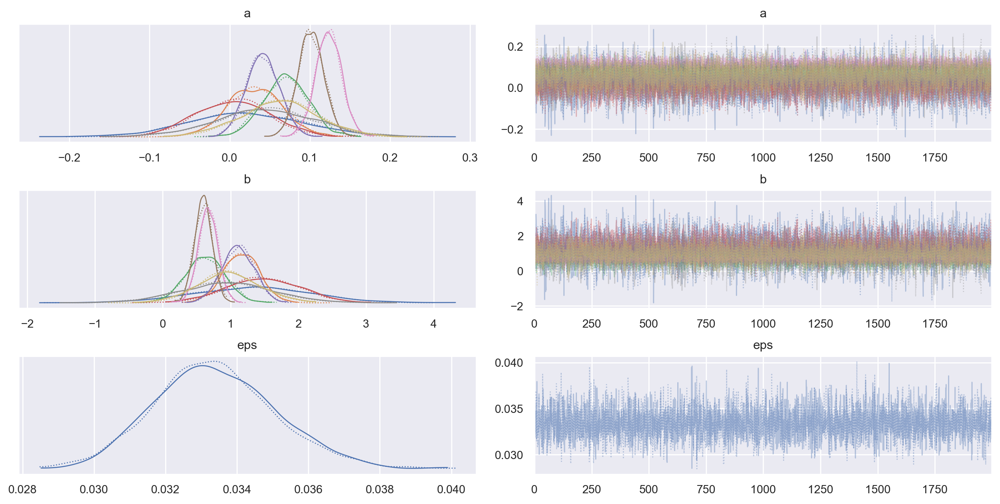

In [255]:
#plot trace plot using MCMC for Unpooled model 
pm.traceplot(unpooled_trace,
             var_names=['a', 'b',
                        'eps']);

# Step 8: Building Complete Pooling Bayesian Models for Relashionship between Internet Access and Poverty
In this section, a complete pooling Bayesian model is created where data from all counties in the Northeastern U.S. is integrated and treated as a single pool. The code defines a model using PyMC3, including independent parameters for each county, model error, and the prediction of the "no internet access rate" based on poverty. The model assumes a single set of parameters for all counties in the region. The likelihood of the observed data is modeled as a normal distribution. This complete pooling approach aggregates the data from all counties and assumes uniform parameter values for the entire region, effectively ignoring county-specific variations. This approach is in contrast to the unpooled model, which allows for individual parameter estimates for each county and accounts for local variations in the relationship between poverty and internet access.

In [279]:
# complete pooling: data from all conunties in NE US is integrated and pooled
with pm.Model() as pooled_model:

    # Independent parameters for each county
    a = pm.Normal('a', 0, sigma = 100)
    b = pm.Normal('b', 0, sigma = 100)

    # Model error
    eps = pm.HalfCauchy('eps', 5)

    # Model prediction of no internet access level 
    NoIntAccRate_est = a + b*data.ACSPctBelPov.values
    # Data likelihood
    y = pm.Normal('y', NoIntAccRate_est, sigma = eps, observed = data.ACSPctNoIntAcc)

# Step 9: Saving Posterior Traces in Complete Pooling Bayesian Modeling
The primary purpose of this code is to create posterior traces for a previously defined Bayesian model (pooled_model) and save those traces for future analysis. The pm.sample function is used to perform Bayesian sampling to generate posterior traces, which capture the parameter estimates and uncertainty. The traces can be essential for posterior analysis and diagnostics.

In [258]:
%%time
with pooled_model:
    pooled_trace = pm.sample(2000, cores=1)

# saving the unpooled model 
pm.save_trace(pooled_trace,'SavedModels/pooled',overwrite=True)

#if the model is previosly run and traces are created, I only load them
#with pooled_model:
#    pooled_trace = pm.load_trace('SavedModels/pooled')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, b, a]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1057 seconds.


Wall time: 17min 59s


# Step 10: Analyzing Posterior Distributions of Parameters in Complete Pooling Bayesian Models
The code plots the trace of parameters for a pooled model, specifically for 'a,' 'b,' and 'eps.' The resulting model integrates data from all Northeastern counties, producing posterior distributions for the linear regression model's slope and intercept. These posterior distributions exhibit considerable width, suggesting a high standard deviation and substantial uncertainty in the predictive model. One limitation of this model is its inability to capture local relationships, in this case, statewide connections, as it combines all data points into a single analysis, potentially overlooking specific regional nuances.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\arviz\data\io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


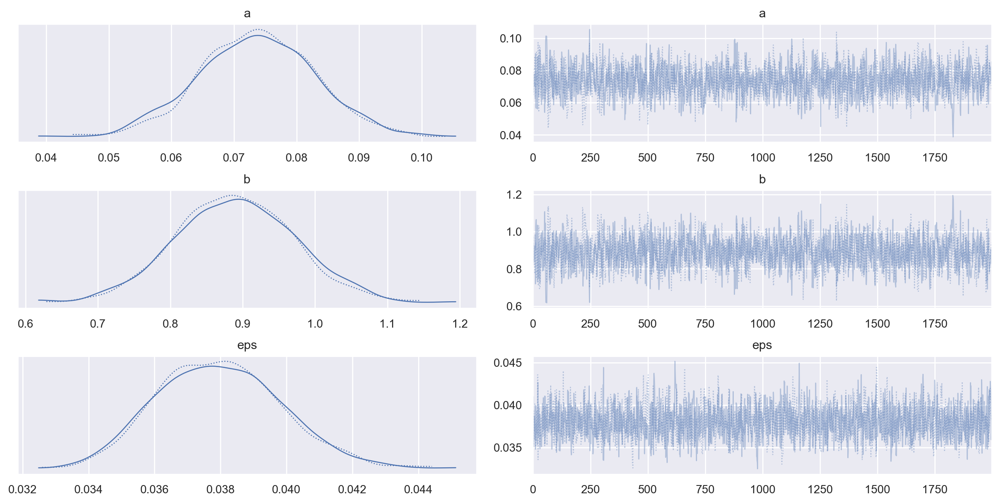

In [282]:
#plot the trace of pooled model parameters 
_=pm.traceplot(pooled_trace,var_names=['a', 'b','eps'])

# Step 11: Building Partial Pooling (Hierarchical Modeling) Bayesian Models for Relashionship between Internet Access and Poverty
In this hierarchical modeling approach, a global distribution is established, allowing model parameters to vary within each state. This captures variations in county data both at the regional level (Northeast) and within individual states. The model uses hyperpriors for group nodes, defining group-level distributions for intercepts and slopes. The intercept and slope are modeled for each state, with distributions centered around their respective group means. The model also accounts for model error. Ultimately, this approach offers a more flexible and realistic representation of the data's hierarchical structure by accommodating variations at multiple levels, from regional to state-specific characteristics.

In [284]:
# partial pooling (hierarchical modeling)
with pm.Model() as hierarchical_model:
    # Hyperpriors for group nodes
    mu_a = pm.Normal('mu_a', mu = 0., sigma = 100)
    sigma_a = pm.HalfNormal('sigma_a', 5.)
    mu_b = pm.Normal('mu_b', mu = 0., sigma = 100)
    sigma_b = pm.HalfNormal('sigma_b', 5.)

    # Intercept for each state, distributed around group mean mu_a
    # in unpooled model, we set mu and sd to a fixed value while here we
    # plug in a common group distribution for all a and b (which are
    # vectors of length n_states).
    a = pm.Normal('a', mu = mu_a, sigma = sigma_a, shape = n_states)
    # slope for each state, distributed around group mean mu_a
    b = pm.Normal('b', mu = mu_b, sigma = sigma_b, shape = n_states)

    # Model error
    eps = pm.HalfCauchy('eps', 5.)

    NoIntAccRate_est = a[state_idx] + b[state_idx]*data.ACSPctBelPov.values

    # Data likelihood
    y = pm.Normal('y', mu = NoIntAccRate_est,sigma = eps, observed = data.ACSPctNoIntAcc)

# Step 12: Assessing the Adequacy of Weakly Informative Priors in Hierarchical Modeling through Prior Predictive Checks
In the process of applying hierarchical modeling, a prior predictive check is performed to assess the adequacy of the specified priors for accurate parameter estimation before observing the actual data. The check involves generating 50 samples from the prior distributions while considering weakly informative priors with wide standard deviations. Subsequently, these prior samples are used to create ensemble plots to visualize the range of possible relationships between variables. The results indicate that the chosen priors can effectively capture a broad spectrum of potential outcomes, which is crucial as there is no prior knowledge about the precise values of intercepts or regressions. The weakly informative priors maintain a mean of zero and a high standard deviation (100) for intercept and regression parameters.

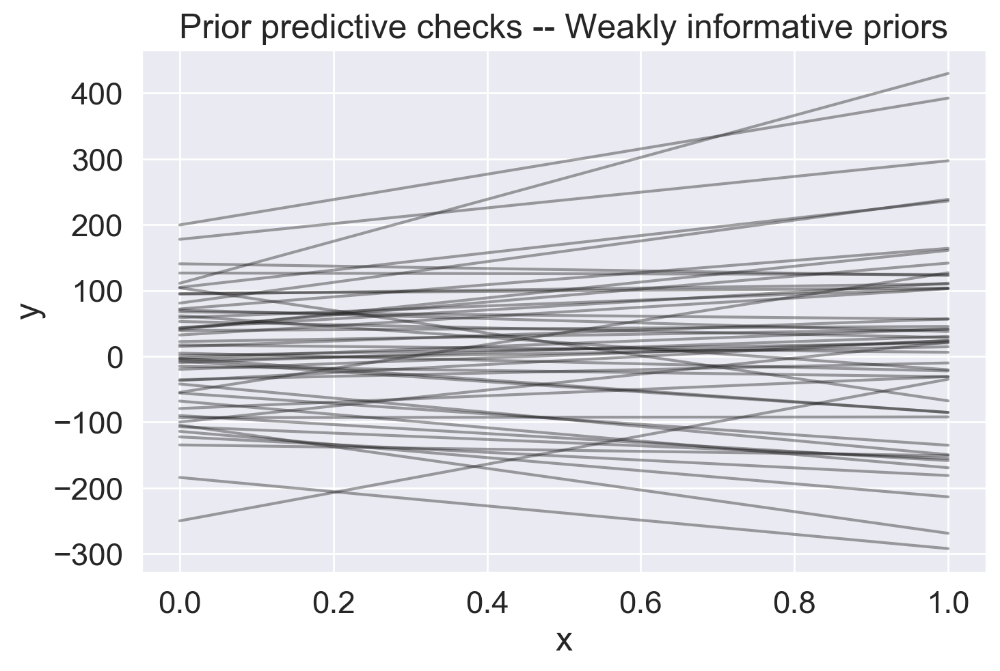

In [578]:
# the Perform Prior predictive check to make sure priors are capable of good estimation
RANDOM_SEED = 23
with hierarchical_model:
    prior_checks = pm.sample_prior_predictive(samples = 50, random_seed = RANDOM_SEED)
_, ax = plt.subplots()

x = np.linspace(0, 1, 50)
#as there are 9 states and aray shape for a and b is 50*9, get average of all 9 states for each ensemble
a=[x.mean() for x in prior_checks["a"]]
b=[x.mean() for x in prior_checks["b"]]
for a, b in zip(a,b):
    Y1 = a + b * x
    ax.plot(x, Y1, c="k", alpha = 0.4)

ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_title("Prior predictive checks -- Weakly informative priors");

# Step 13: Saving Posterior Traces for the Partial Pooling (Hierarchical Modeling)
The code outlines the process of creating and saving posterior traces for a hierarchical model. The model was run initially to generate these traces, saved them for later use, and can loads these pre-existing traces for further analysis in the future. The saved traces enable efficient retrieval and utilization of the hierarchical model's results without rerunning the time-consuming sampling process.

In [288]:
%%time
#Only the first time, run the model to create posterior traces and save the model trace for later load and use 
with hierarchical_model: 
    hierarchical_trace = pm.sample(2000, tune = 2000, target_accept = .9,cores = 1)

    #saving the unpooled model 
pm.save_trace(hierarchical_trace,'SavedModels/hierarchical',overwrite = True)

#if the model is previosly run and traces are created, I only load them
#with hierarchical_model:
#    hierarchical_trace = pm.load_trace('SavedModels/hierarchical')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, b, a, sigma_b, mu_b, sigma_a, mu_a]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 4886 seconds.
There were 108 divergences after tuning. Increase `target_accept` or reparameterize.
There were 210 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


Wall time: 1h 21min 49s


'SavedModels/hierarchical'

# Step 14: Traceplot Visualization of Partial Pooling (Hierarchical Modeling) Parameters and Hyperparameters
This code generates traceplot visualizations for the parameters and hyperparameters of the hierarchical model, providing insights into the distributions and behaviors of these variables.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\arviz\data\io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


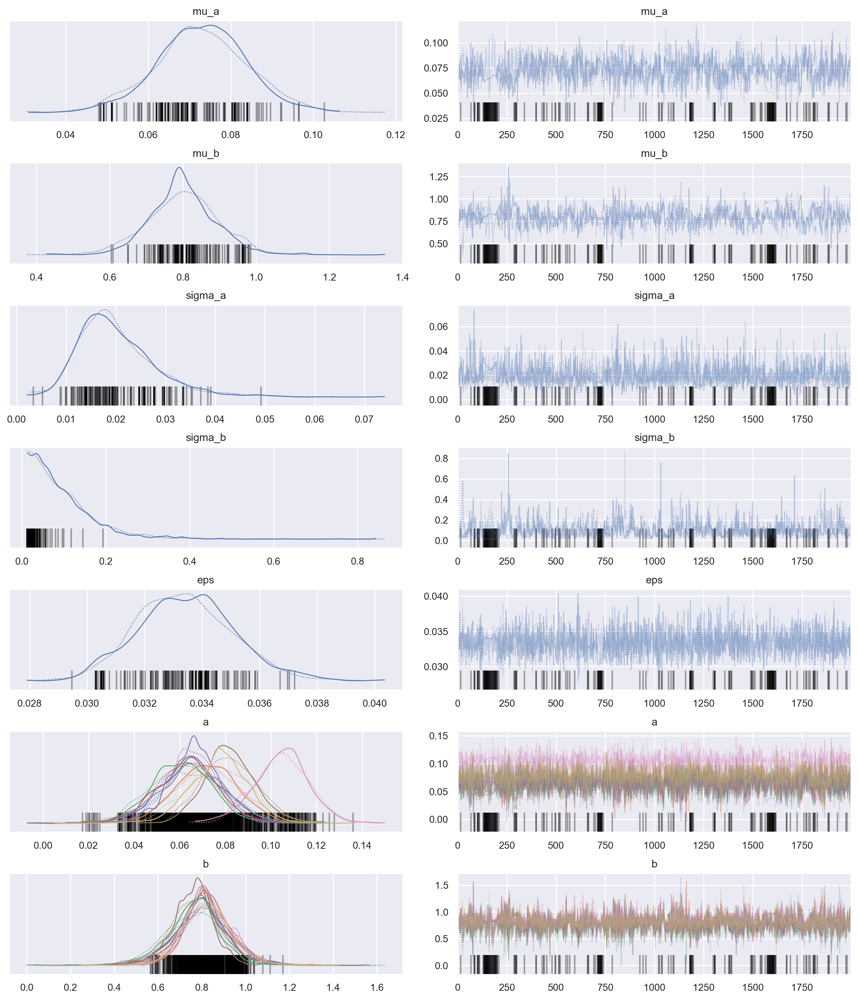

In [291]:
#plot the trace of hierarchical model parameters 
_=pm.traceplot(hierarchical_trace,var_names = ['mu_a', 'mu_b','sigma_a', 
                                               'sigma_b','eps','a','b'])

# Step 15: Baseline Linear Regression Model for Internet Access and Poverty Relationship
A linear regression model is built to serve as a baseline for comparison with the hierarchical Bayesian model. The model aims to predict the percentage of the population in each county with no internet access (ACSPctNoIntAcc) based on the percentage of the population in each county with income below the poverty line (ACSPctBelPov) using data from ACS 2018 5-year estimates. The code calculates and prints the Mean Absolute Error (MAE) and the Root Mean Square Error (RMSE) for this linear regression model, which helps assess its predictive performance and accuracy.

In [419]:
#Linear Regression Model
#below a linear regression model is built for use as a baseline to compare with the
# hierarchical bayesial model.
#ACSPctNoIntAcc: percent population in each county with no internet access 
# (from ACS 2018 5-year estimates)
#ACSPctBelPov: percent population in each county with income below the poverty line 
# (from ACS 2018 5-year estimates)
lrmodel = LinearRegression()
x1 = data.ACSPctBelPov.values.reshape(-1, 1)
y1 = data.ACSPctNoIntAcc.values.reshape(-1, 1)
_ = lrmodel.fit(x1, y1)
predictions = lrmodel.predict(x1)

#get a(intercept) and b (slope) of the fitted Linear Reg. eq.
aLR = lrmodel.intercept_[0]
bLR = lrmodel.coef_[0][0]

# Metrics
print('MAE for LR Model is :%s'%np.mean(abs(predictions - y1)))
print('RMSE for LR Model is :%s'%np.sqrt(mean_squared_error(y1,predictions)))

MAE for LR Model is :0.029002931100045433
RMSE for LR Model is :0.03751744181755058


# Step 16: Performance Evaluation of Bayesian Models Using MAE and RMSE
In this step, the performance of three different models, namely, the unpooled, pooled, and partially pooled (hierarchical models), is evaluated by calculating their Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE) using posterior samples. Both MAE and RMSE are used to assess how well the models predict the target variable, with RMSE providing a stronger penalty for large errors. The results indicate that all three models performed well, achieving low MAE and RMSE values, typically between 0.02 and 0.03. The unpooled and hierarchical models slightly outperformed the pooled model, with the hierarchical model exhibiting a slightly better performance compared to the linear regression model.

In [347]:
def evaluate_bayesian_model(trace, y, modelname):
    
    """
    This function calculates the performance of a bayesian model based on generated posterior samples  

    INPUTS:
    trace: a set of posterior samples to use for evaluation 
    y: the target dataset 
    modelname: the name of the Bayesian model to evaluate

    OUTPUTS: 
    the function returns the modified input_txt with the specified patterns removed
    """
    
    ppc=pm.sample_posterior_predictive(trace=trace[1000:],
                                       model = modelname, samples = 1000)
    pred = ppc['y'].mean(axis = 0)
    rmse = np.sqrt(mean_squared_error(y, pred))
    mae = mean_absolute_error(y, pred)
    return mae, rmse  

#calculate MAE & RMSE of the three models 
#unpooled
evaluate_bayesian_model(unpooled_trace, data.ACSPctNoIntAcc.values, unpooled_model)

#pooled
evaluate_bayesian_model(pooled_trace, data.ACSPctNoIntAcc.values, pooled_model)

#partially pooled (hierarchical)
evaluate_bayesian_model(hierarchical_trace, data.ACSPctNoIntAcc.values, hierarchical_model)

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\pymc3\sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


(0.023695886491249932, 0.031802011727358075)

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\pymc3\sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


(0.029071114126606786, 0.037603778283053974)

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\pymc3\sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


(0.024489815592855558, 0.03247882429356512)

# Step 17: Comprehensive Model Evaluation and Comparison for Regression
The evaluate function is designed to assess the performance of various regression models by employing the Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE) metrics. It takes as input the features and target values of both training and testing datasets, along with predictions made by a hierarchical Bayesian model. The function initializes a set of regression models, including Linear Regression, ElasticNet Regression, Random Forest, Extra Trees, Support Vector Machine (SVM), and Gradient Boosted models. It then trains these models using the training data and computes their predictions on the test data. For the hierarchical Bayesian model, it uses the provided predictions directly. MAE and RMSE values are computed for each model and recorded in a Pandas DataFrame. The function also calculates baseline MAE and RMSE based on the median value of the training data. The results are visualized through two bar plots, making it easy to compare the performance of different models. This function offers a comprehensive evaluation of regression models and serves as a valuable tool for model selection and comparison.

The summary of the results indicates that tree-based models, such as Random Forest and Extra Trees, perform less effectively than the baseline model. This discrepancy can be attributed to the problem's linear nature, as tree-based models are better suited for complex, nonlinear relationships. Meanwhile, Support Vector Machine (SVM) outperforms tree-based models but is closely aligned with the baseline, suggesting that it may not be the most appropriate choice for this linear problem. SVMs are typically employed for both linear and nonlinear problems when dealing with small datasets, whereas Neural Networks (NN) are preferable for larger datasets. Elastic Net Regression, designed to balance the bias-variance trade-off and manage model complexity, delivered results similar to the baseline. Given the single predictor used in the analysis, Elastic Net may not be the optimal choice. Notably, both Linear Regression and Hierarchical Regression yielded the best performance among all tested models. The Hierarchical model's added benefit of uncertainty analysis makes it the preferred choice over the traditional Linear Regression model. It's also suggested that a more robust approach would involve holding out 10-20% of counties within each state for testing. Subsequently, the hierarchical model could be applied to the test set counties within each state to calculate RMSE and MAE, providing a more detailed analysis of error at both the state and regional levels.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\ipykernel_launcher.py:38: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\ipykernel_launcher.py:38: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array w

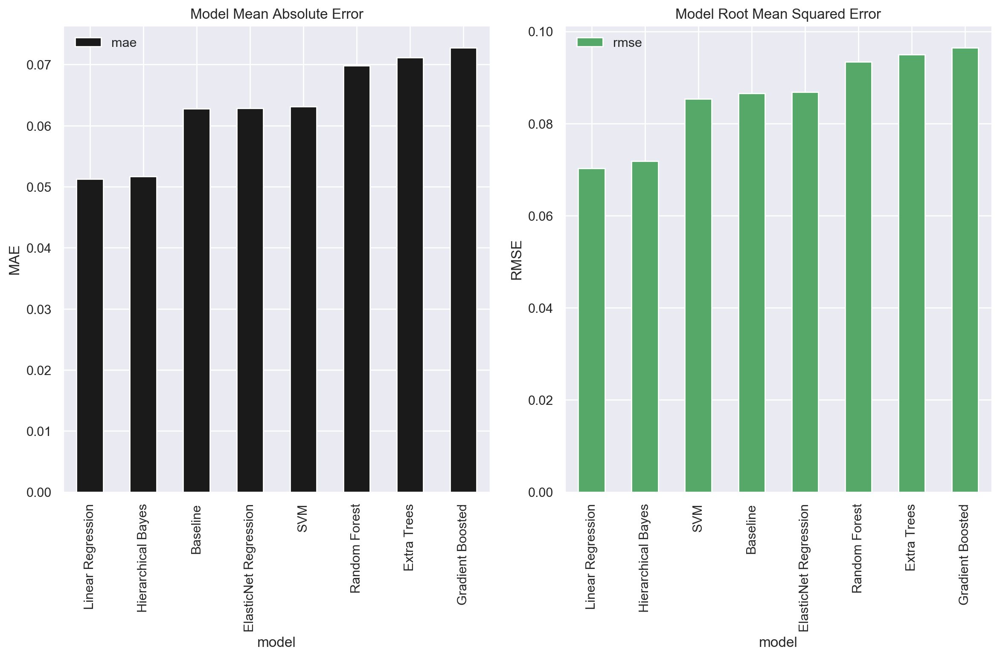

In [820]:
# Evaluate several ml models by training on training set and testing on testing set
#define train datasets 
X_train = data.ACSPctBelPov.values.reshape(-1, 1)
y_train = data.ACSPctNoIntAcc.values.reshape(-1, 1)

#use northeastern states data for check
df_ne = df[df.Region=='Northeast'].dropna()
X_test = df_ne.ACSPctBelPov.values.reshape(-1, 1)
y_test = df_ne.ACSPctNoIntAcc.values.reshape(-1, 1)

#calculate the average of a & b for the trained hierrhical model
hier_avga = hier_a.mean()
hier_avgb = hier_b.mean()
hier_pred = hier_avga + hier_avgb*X_test

#hier_pred is the prediction for hierarchical model made using average model parameters
def evaluate(X_train, X_test, y_train, y_test, hier_pred):
    
    """
    Evaluate the performance of various regression models using MAE and RMSE metrics.

    INPUTS:
    X_train: Features of the training dataset.
    X_test: Features of the testing dataset.
    y_train: Target values of the training dataset.
    y_test: Target values of the testing dataset.
    hier_pred: Predictions made by the hierarchical Bayesian model.

    OUTPUTS:
    results: A Pandas DataFrame containing MAE and RMSE scores for different models.
    """
    
    # Names of models
    model_name_list = ['Hierarchical Bayes','Linear Regression', 'ElasticNet Regression',
                      'Random Forest', 'Extra Trees', 'SVM',
                       'Gradient Boosted', 'Baseline']
    
    # Instantiate the models
    model1 = LinearRegression()
    model2 = ElasticNet()
    model3 = RandomForestRegressor(n_estimators=1000)
    model4 = ExtraTreesRegressor(n_estimators=1000)
    model5 = SVR()
    model6 = GradientBoostingRegressor(n_estimators=1000)
    
    # Dataframe for results
    results = pd.DataFrame(columns=['model','mae', 'rmse'])
    results['model'] = model_name_list
    # Train and predict with each model
    for i, model in enumerate([np.nan, model1, model2, model3, model4, model5, model6]):
        if i == 0:
            predictions=hier_pred
        else:      
            model.fit(X_train, y_train)
            predictions = model.predict(X_test)

        # Metrics
        mae = np.mean(abs(predictions - y_test))
        rmse = np.sqrt(np.mean((predictions - y_test) ** 2))
         # Insert results into the dataframe
        results.loc[i,['mae','rmse']]=[mae,rmse]
    
    # Median Value Baseline Metrics
    baseline = np.median(y_train)
    baseline_mae = np.mean(abs(baseline - y_test))
    baseline_rmse = np.sqrt(np.mean((baseline - y_test) ** 2))
    
    results.loc[7, ['mae','rmse']] = [baseline_mae, baseline_rmse]
    
    fig = plt.figure(figsize=(12, 8))
    matplotlib.rcParams['font.size'] = 16
    # Root mean squared error
    ax =  plt.subplot(1, 2, 1)
    results.sort_values('mae', ascending = True).plot.bar(x='model', 
                                                          y = 'mae', color = 'k', ax = ax)
    plt.title('Model Mean Absolute Error'); plt.ylabel('MAE');

    # Median absolute percentage error
    ax = plt.subplot(1, 2, 2)
    results.sort_values('rmse', ascending = True).plot.bar(x='model',
                                                           y = 'rmse', color = 'g', ax = ax)
    plt.title('Model Root Mean Squared Error'); plt.ylabel('RMSE');

    plt.tight_layout()
    
    return results
_=evaluate(X_train, X_test, y_train, y_test, hier_pred)        

# Step 18: Shrinkage Effect - Visualizing Hierarchical Bayesian Model's Impact on Intercept and Slope Parameters
The following plot showcases how the hierarchical Bayesian model effectively shrinks the slope and intercept of the regression model by implementing partial pooling. This process allows for a global region-wide training while taking into account the uncertainties within each state. The plot displays the mean values for intercept (a) and slope (b) parameters obtained from the hierarchical model, unpooled Bayesian model, and pooled Bayesian model, along with a non-Bayesian Linear Regression model. The hierarchical model demonstrates the most significant shrinkage effect, reducing the impact of extreme values and improving model robustness. The arrows connecting the unpooled model values to the hierarchical model values highlight the extent of the shrinkage. Overall, this visualization highlights the advantages of the hierarchical Bayesian approach in capturing regional variations while maintaining stability and reliability in the model.

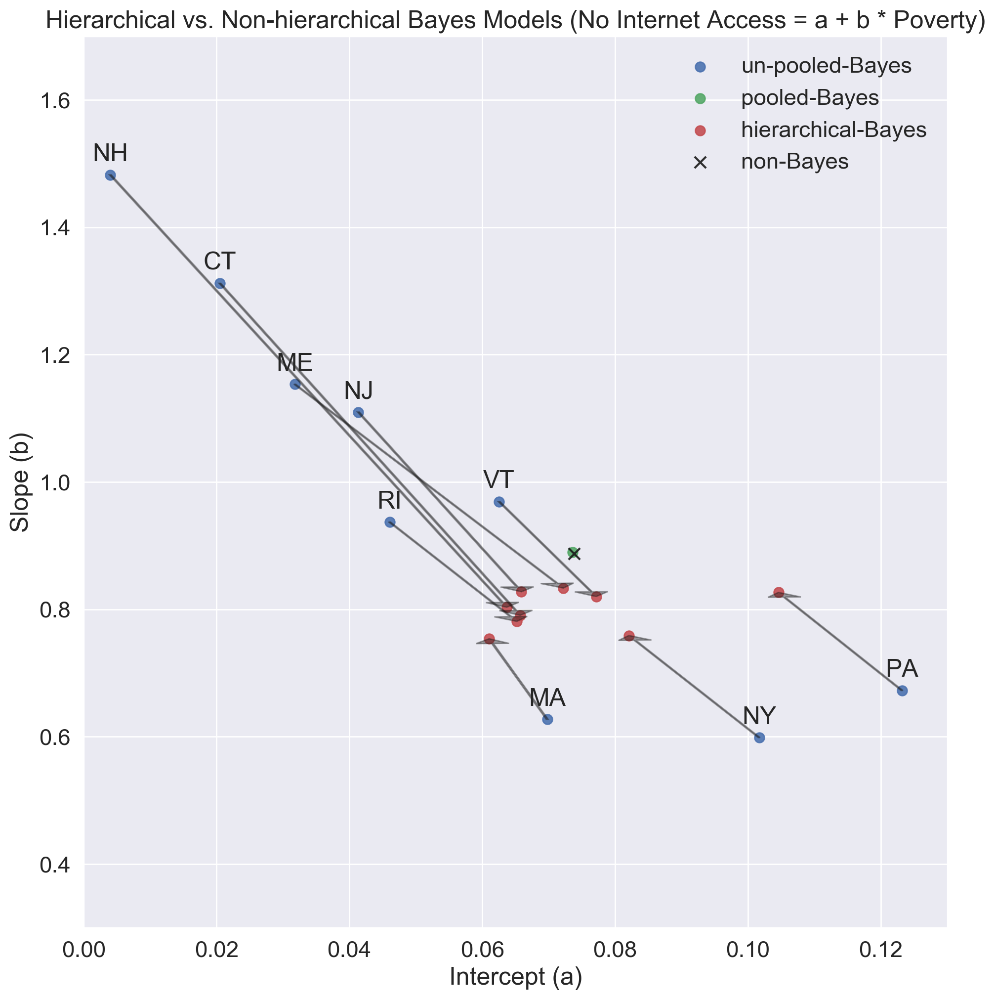

In [450]:
# plot the shirnkage
hier_a = hierarchical_trace['a'][500:].mean(axis = 0)
hier_b = hierarchical_trace['b'][500:].mean(axis = 0)
unp_a = [unpooled_trace['a'][500:, np.where(state_names == c)[0][0]].mean() for c in state_names]
unp_b = [unpooled_trace['b'][500:, np.where(state_names == c)[0][0]].mean() for c in state_names]
pool_a = pooled_trace['a'][500:].mean(axis=0)
pool_b = pooled_trace['b'][500:].mean(axis=0)

fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111, xlabel='Intercept (a)', ylabel='Slope (b)',
                     title = 'Hierarchical vs. Non-hierarchical Bayes Models (No Internet Access = a + b * Poverty)',
                     xlim = (0, 0.13), ylim = (0.3, 1.7))

ax.scatter(unp_a, unp_b, c = 'b',s = 50, alpha = 0.9, label = 'un-pooled-Bayes')
ax.scatter(pool_a, pool_b,c = 'g',s = 50, alpha = 0.9, label = 'pooled-Bayes')
ax.scatter(hier_a, hier_b, c = 'r', s = 50, alpha = 0.9, label = 'hierarchical-Bayes')

#add the linear regression values 
ax.scatter(aLR, bLR, c = 'k',s = 70, marker='x', alpha = 0.9, label = 'non-Bayes')

for i in range(len(unp_a)):
    ax.arrow(unp_a[i], unp_b[i], hier_a[i] - unp_a[i], hier_b[i] - unp_b[i],width = 0.0003,
             fc = "k", ec = "k", length_includes_head = True, alpha = 0.4, head_width = .005)


[plt.annotate(s, (unp_a[i], unp_b[i]), textcoords = "offset points", xytext = (
    0,10), ha = 'center') for i,s in enumerate(state_names)]  
ax.legend();

# Step 19: Posterior Predictive Check (PPC) for Hierarchical Bayesian Model - Validating Model Performance
A posterior predictive check (PPC) is conducted for the hierarchical Bayesian model. This process involves drawing posterior samples to generate 100 histograms, allowing for a visual comparison with the target variable. Additionally, the mean of all 100 posterior samples is presented for reference. The PPC provides a critical assessment of the model's ability to capture the data's distribution and serves as a valuable tool for model validation and diagnostics.

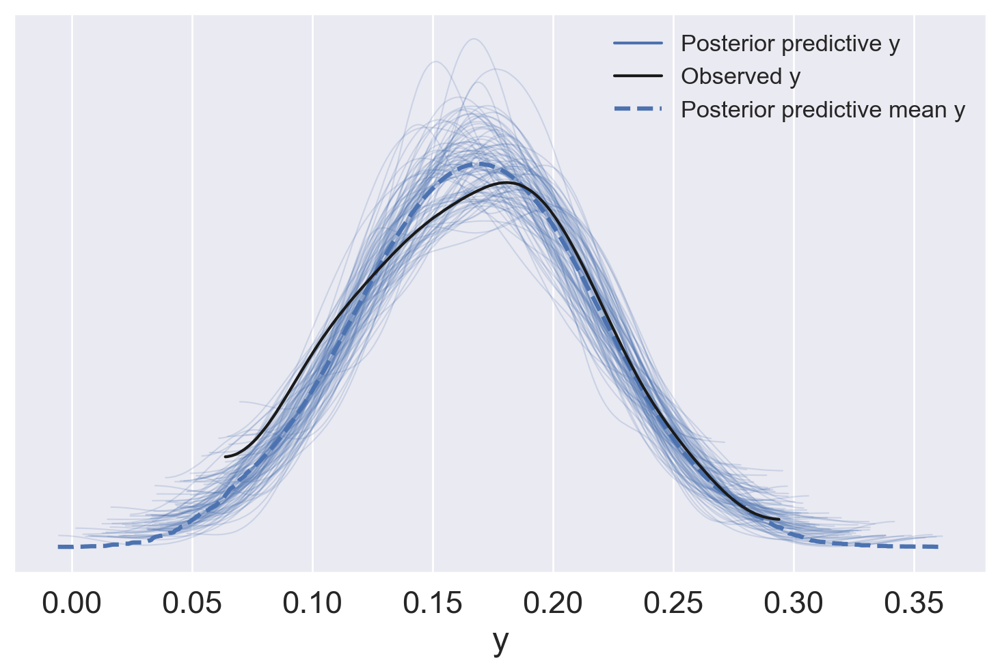

In [589]:
# perform posterior predictive check (PPC)
with hierarchical_model:
    PPC = pm.sample_posterior_predictive(
        hierarchical_trace, var_names = ["a", "b", "y"], random_seed = RANDOM_SEED
    )
idata = az.from_pymc3(hierarchical_trace, posterior_predictive=PPC)
az.plot_ppc(idata,num_pp_samples = 100);

# Step 20: Visualizing the Predictive Relationship: Posterior Predictive Checks of the Hierarchical Bayesian Model
In this step, the predicted relationship between the predictor (Poverty Rate) and the outcome (No Internet Access Rate) is visualized within the context of a hierarchical Bayesian model. Due to the model's hierarchical nature, multiple sets of 'a' and 'b' values are provided for the nine states within the Northeast (NE) region. To create predictions, the average values of 'a' and 'b' (mu_pp) are calculated before applying the prediction equation. The plot displays the actual data points, the mean outcome generated based on these average parameters, and the 94% Highest Posterior Density (HPD) intervals. The mean outcome signifies the belief about the No Internet Access Rate, established through the average values of posteriors for 'a' and 'b.' The 94% HPD for the mean outcome (approximately ranging from 0.09 to 0.27) provides the credible interval for this belief. Furthermore, the 94% HPD for the outcome (ranging from around 0.04 to 0.33) denotes the credible interval for 'y,' as determined from all the posteriors of 'y' originating from MCMC samples, represented by the blue spaghetti plot in section 19. This step allows the assessment of the model's capability to predict the relationship between these two variables.

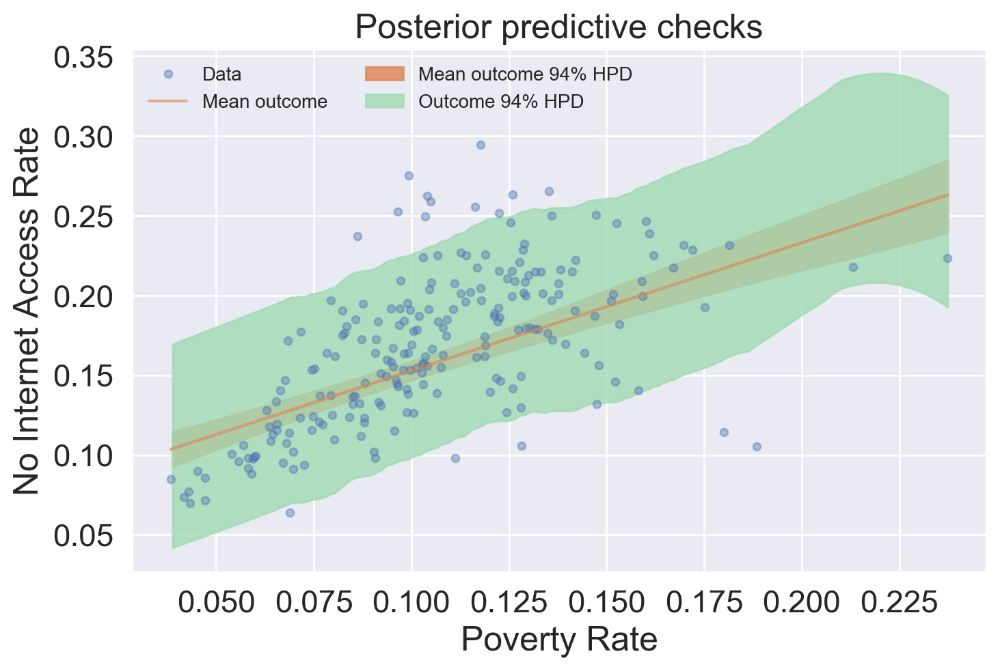

In [718]:
# plot the predicted relationship between the predictor and the outcome 
X_train = X_train.squeeze()
y_train = y_train.squeeze()
MU_PP = (PPC["a"].mean(1) + PPC["b"].mean(1)* X_train[:, None]).T

_, ax = plt.subplots()

ax.plot(X_train, y_train, "o", ms = 4, alpha = 0.4, label = "Data")
ax.plot(X_train, MU_PP.mean(0), label = "Mean outcome", alpha = 0.6)
az.plot_hpd(
    X_train,
    MU_PP,
    ax=ax,
    fill_kwargs = {"alpha": 0.8, "label": "Mean outcome 94% HPD"},
)
az.plot_hpd(
    X_train,
    PPC["y"],
    ax=ax,
    fill_kwargs = {"alpha": 0.8, "color": "#a1dab4", "label": "Outcome 94% HPD"},
)

ax.set_xlabel("Poverty Rate")
ax.set_ylabel("No Internet Access Rate")
ax.set_title("Posterior predictive checks")
ax.legend(ncol = 2, fontsize = 10);

# Step 21: Visualizing Credible Intervals: Hierarchical vs. Unpooled Predictions
In this step, credible intervals for both unpooled and pooled predictions are depicted using two separate forest plots. The top plot displays the ranges of coefficients for the hierarchical model, while the bottom plot illustrates the ranges for the unpooled model. Notably, the 'b' values exhibit greater uncertainty and standard deviation in the unpooled model due to the limited number of data points. This issue is effectively addressed in the hierarchical model, where uncertainty is reduced. These plots provide a clear visual representation of the improved reliability and accuracy achieved through the hierarchical approach.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\arviz\data\io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\arviz\data\io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


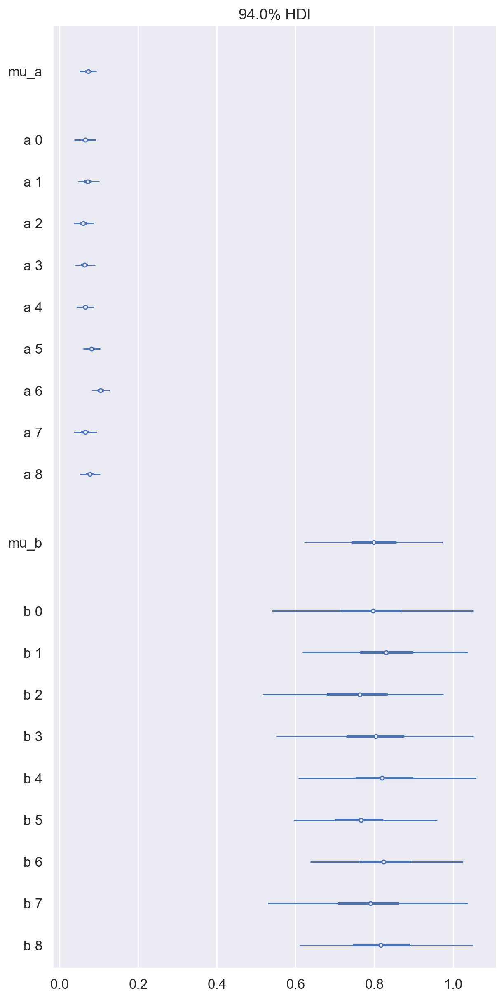

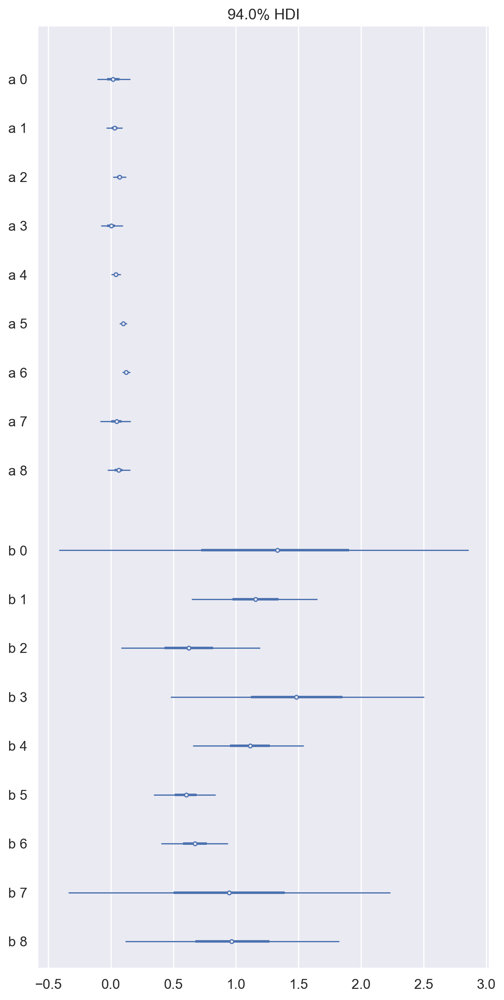

In [762]:
#Step 12: Plot the credible intervals for unpooled and pooled predictions 
_ = az.plot_forest(hierarchical_trace, 
                      var_names = ['mu_a',"a",'mu_b', "b"], 
                      combined = True, textsize = 12,figsize = (6,12));
_ = az.plot_forest(unpooled_trace, 
                      var_names = ["a", "b"], 
                      combined = True, textsize = 12,figsize = (6,12));

# Step 22: Comparing Unpooled, Complete Pooling, and Partially Pooled (Hierarchical Bayesian) Predictions for Statewide Internet Access Rates
In this step, we visualize and compare unpooled, complete pooling, and partially pooled (hierarchical Bayesian) predictions for each state's relationship between poverty rate and the rate of no internet access. These visualizations demonstrate how well each model captures statewide variations. The hierarchical Bayesian model consistently outperforms the other models by accurately capturing statewide variations. In contrast, the no pooling Bayesian model satisfies the region-wide variation but struggles with accurate state-wide predictions. The complete pooling Bayesian model offers better representation of state-wide variation but fails in states with limited data points. The hierarchical Bayesian model, with its incorporation of global region-wide trends and consideration of data uncertainties within each state, proves to be a valuable approach for states with limited data.

C:\Users\BabakRoodsari\AppData\Local\ESRI\conda\envs\geo_envpro\lib\site-packages\ipykernel_launcher.py:36: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


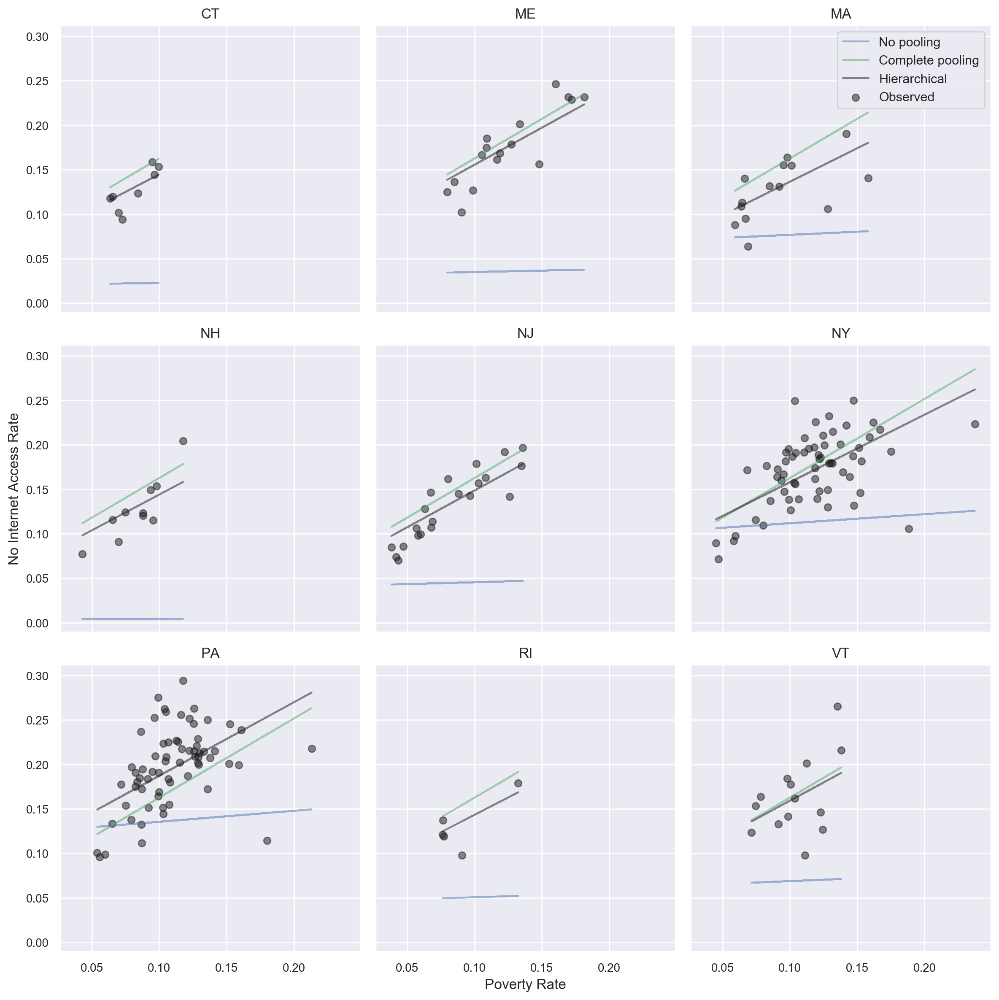

In [819]:
# plot unplooed vs. partial pooled predcirion lines for each state 
sns.set(font_scale = 1.)
fig, axes = plt.subplots(3, 3, figsize = (12, 12), 
                         sharey = True, sharex = True)

#create a datafram to store all average model coeficients 
mean_coef_df = pd.DataFrame(columns = ['State','hier','pooled','unpooled'])
for i,(ax, c) in enumerate(zip(axes.ravel(), state_names)):
    #create a mask for the state
    state_mask = data.State.isin([c])
    
    #obtain x data for the state and observed
    x_state = data.ACSPctBelPov[state_mask]
    obs_state = data.ACSPctNoIntAcc[state_mask]
   
    #calculate predictions for different models 
    hier_pred = hier_a[i] + hier_b[i]*x_state
    pool_pred = pool_a + pool_b*x_state 
    unp_pred = unp_a[i] + unp_a[i]*x_state
       
    #observed plot
    ax.scatter(x_state, obs_state, c = "k", alpha = 0.5, label = "Observed")
    #plot line for unpooled
    ax.plot(x_state, unp_pred, "b", alpha = 0.5, label = "No pooling")
    #plot for pooled
    ax.plot(x_state, pool_pred, "g", alpha = 0.5, label = "Complete pooling")
    #hierarchical
    ax.plot(x_state, hier_pred, "k", alpha = 0.5, label = "Hierarchical")
    
  
    ax.set_title(c); ax.set_xlabel(""); ax.set_ylabel("")
    ax.tick_params(labelsize = 10)

axes[1,0].set_ylabel("No Internet Access Rate"); axes[2,1].set_xlabel("Poverty Rate")
axes[0,2].legend(frameon = True)
fig.tight_layout();

# Step 23: Review and Comparison of Final Model Coeficients in Northeastern U.S. States
A Pandas dataframe is created to store the coefficients (a and b) for different methods used in the hierarchical Bayesian modeling. The equation used for modeling is "No Internet Access Rate = a + b * Poverty Rate." The dataframe contains coefficients for each state, including hierarchical Bayesian coefficients (hier_a and hier_b), pooled Bayesian coefficients (pool_a and pool_b), unpooled Bayesian coefficients (unpooled_a and unpooled_b), and linear regression coefficients (linearreg_a and linearreg_b). The resulting dataframe, named "mean_coef_df," is then exported to a CSV file for further analysis and reference.

In [863]:
# create a dataframe to store a and b coeficients for different methods 
#Equation: No Internet Access Rate = a + b* Poverty Rate 
d={'State':state_names,'hier_a':hier_a,'hier_b':hier_b,
 'pool_a':pool_a,'pool_b':pool_b,
 'unpooled_a':unp_a,'unpooled_b':unp_b,'linearreg_a':aLR,'linearreg_b':bLR}
mean_coef_df=pd.DataFrame(data=d)
mean_coef_df.to_csv('Data/MeanEqCoefs.csv',index=False)
mean_coef_df

,State,hier_a,hier_b,pool_a,pool_b,unpooled_a,unpooled_b,linearreg_a,linearreg_b
0,CT,0.065697,0.790527,0.073598,0.890072,0.020513,1.312007,0.073777,0.887648
1,ME,0.072194,0.833259,0.073598,0.890072,0.031780,1.153473,0.073777,0.887648
2,MA,0.061025,0.753700,0.073598,0.890072,0.069773,0.626984,0.073777,0.887648
3,NH,0.063677,0.803188,0.073598,0.890072,0.004013,1.482386,0.073777,0.887648
4,NJ,0.065888,0.827533,0.073598,0.890072,0.041344,1.109776,0.073777,0.887648
5,NY,0.082061,0.758762,0.073598,0.890072,0.101668,0.598429,0.073777,0.887648
6,PA,0.104564,0.826482,0.073598,0.890072,0.123171,0.672347,0.073777,0.887648
7,RI,0.065196,0.780961,0.073598,0.890072,0.046042,0.937087,0.073777,0.887648
8,VT,0.077141,0.820007,0.073598,0.890072,0.062522,0.969235,0.073777,0.887648
